In [2]:
import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
from imspy.simulation.experiment import TimsTofSyntheticPrecursorFrameBuilder
from imspy.timstof.dia import TimsDatasetDIA

In [17]:
ds = TimsDatasetDIA("/media/hd02/data/raw/dia/blanks/blanks-dia-PASEF/G241217_012_Slot2-2_1_16313.d/")

frame_builder = TimsTofSyntheticPrecursorFrameBuilder(
    "/media/hd02/data/sim/redone/dia/hela/125K/TIMSIM-HeLa125K-003/synthetic_data.db"
)

In [4]:
import tensorflow as tf
from neural_isotope_detector.models import TCNSegmenterResidual, TCNSegmenter, MaskedCategoricalCrossentropy

RESOLUTION = 2
BIN_SIZE = 0.01

def isotope_dilation_rates(bin_size=0.01, max_charge=5):
    mz_spacing = 1.003
    return [max(1, int(round(mz_spacing / (bin_size * z)))) for z in range(1, max_charge + 1)]

dilation_rates = isotope_dilation_rates(bin_size=BIN_SIZE, max_charge=10)

# 3) Instantiate & compile
model = TCNSegmenter(9, 7, 7, dilation_rates=dilation_rates)

loss_weights = {'iso': 1.0, 'chg': 1.0, 'pep': 0.2}

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss={'iso':MaskedCategoricalCrossentropy(1),
          'chg':MaskedCategoricalCrossentropy(1),
          'pep':MaskedCategoricalCrossentropy(1)},
    metrics={'iso':'accuracy','chg':'accuracy','pep':'accuracy'},
    loss_weights=loss_weights,
)

# 4) Callbacks
callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1),
    # tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    tf.keras.callbacks.TensorBoard(log_dir='logs/fit'),
]

In [10]:
from neural_isotope_detector.utility import collect_dense_windows, to_tf_train, to_tf_inference

# 0) Collect training data
# results = collect_dense_windows(ds, frame_builder, num_iterations=64, window_length=10, resolution=RESOLUTION, min_intensity=5.0, min_num_peaks=3)

In [7]:
# 1) Build the TF datasets via your helper
train_ds, val_ds = to_tf_train(
    results["mz"],
    results["mobility"],
    results["X"],
    results["iso_labels"],
    results["charge_labels"],
    results["pep_labels"],
    test_fraction=0.2,
    batch_size=128,
    seed=55,
)

2025-05-30 17:29:54.320000: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


In [11]:
# 5) Train
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=12,
    callbacks=callbacks
)

Epoch 1/12
52/52 [==============================] - 7s 31ms/step - loss: 3.7555 - chg_loss: 1.1704 - iso_loss: 2.1216 - pep_loss: 2.3178 - chg_accuracy: 0.0768 - iso_accuracy: 0.0680 - pep_accuracy: 0.0254 - val_loss: 2.4659 - val_chg_loss: 0.8122 - val_iso_loss: 1.3971 - val_pep_loss: 1.2833 - val_chg_accuracy: 0.0417 - val_iso_accuracy: 0.0314 - val_pep_accuracy: 0.0315 - lr: 0.0010
Epoch 2/12
52/52 [==============================] - 1s 20ms/step - loss: 1.6198 - chg_loss: 0.4122 - iso_loss: 0.9376 - pep_loss: 1.3498 - chg_accuracy: 0.0547 - iso_accuracy: 0.0477 - pep_accuracy: 0.0343 - val_loss: 1.6909 - val_chg_loss: 0.5235 - val_iso_loss: 0.9605 - val_pep_loss: 1.0345 - val_chg_accuracy: 0.0463 - val_iso_accuracy: 0.0389 - val_pep_accuracy: 0.0355 - lr: 0.0010
Epoch 3/12
52/52 [==============================] - 1s 20ms/step - loss: 1.2728 - chg_loss: 0.3163 - iso_loss: 0.7295 - pep_loss: 1.1351 - chg_accuracy: 0.0565 - iso_accuracy: 0.0507 - pep_accuracy: 0.0357 - val_loss: 1.4341

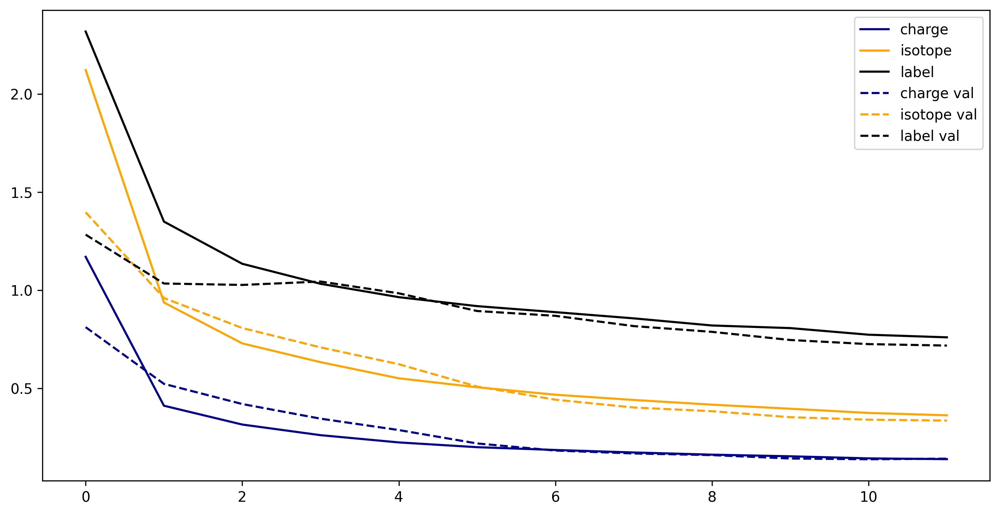

In [12]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history.history["chg_loss"], label="charge", color="darkblue")
plt.plot(history.history["iso_loss"], label="isotope", color="orange")
plt.plot(history.history["pep_loss"], label="label", color="black")
plt.plot(history.history["val_chg_loss"], linestyle="--", label="charge val", color="darkblue")
plt.plot(history.history["val_iso_loss"], linestyle="--", label="isotope val", color="orange")
plt.plot(history.history["val_pep_loss"], linestyle="--", label="label val", color="black")
plt.legend()
plt.show()

In [8]:
from neural_isotope_detector.models import TCNSegmenterResidual, TCNSegmenter, MaskedCategoricalCrossentropy
import tensorflow as tf

# model.save("best-neural-feature-finder")
model = tf.keras.models.load_model(
     "best-neural-feature-finder/",
     custom_objects={'MaskedCategoricalCrossentropy': MaskedCategoricalCrossentropy}
)

1/1 [==============================] - 0s 478ms/step


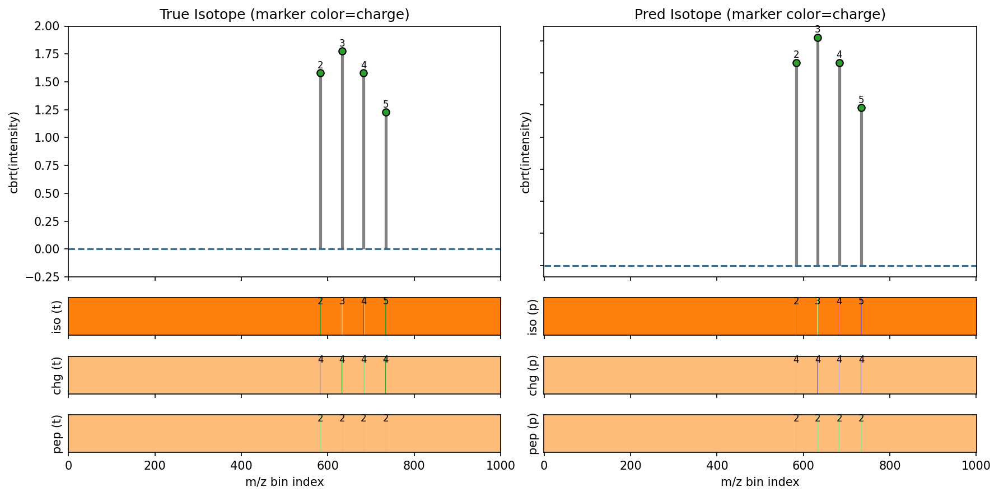

In [18]:
from neural_isotope_detector.utility import to_tf_inference, fix_zero_predictions_numpy

noise = ds[np.random.choice(ds.precursor_frames)].to_noise_annotated_tims_frame()

frame = frame_builder.build_precursor_frame_annotated(np.random.choice(ds.precursor_frames))
frame_noise = frame + noise

scan_index, window_index, mz, mobility, X, iso_labels, charge_labels, pep_labels = frame_noise.to_dense_windows_with_labels(
    window_length=10, min_num_peaks=3, min_intensity=5.0, overlapping=False, resolution=RESOLUTION,
)

inf_ds = to_tf_inference(mz, mobility, X, 512)

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Assume the following variables are already in scope from your data prep:
# scan_index, window_index, mz, mobility, X, iso_labels, charge_labels, pep_labels
# and your trained model `model`.

# 1) Prepare inputs exactly as you did for training/inference
X_scaled = np.cbrt(X)
n_rows, n_cols = X_scaled.shape
mz_chan  = np.repeat((mz/1000.0)[:,None], n_cols, axis=1)
mob_chan = np.repeat(mobility[:,None], n_cols, axis=1)
X_input  = np.stack([X_scaled, mz_chan, mob_chan], axis=-1)

# Remap labels to non-negative integer indices
def remap(lbl): return (lbl + 2).astype(int)
iso_m = remap(iso_labels)
chg_m = remap(charge_labels)
pep_m = remap(pep_labels)

# 2) Pick K examples to visualize
K = 1
idxs = np.arange(K)   # or pick random: np.random.choice(n_rows, K, replace=False)
X_vis    = X_input[idxs]
iso_true = iso_m[idxs]
chg_true = chg_m[idxs]
pep_true = pep_m[idxs]
scan_vis = scan_index[idxs]
mz_vis   = mz[idxs]
mob_vis  = mobility[idxs]

# 3) Run model predictions
preds = model.predict(X_vis)  # {'iso':(...), 'chg':(...), 'pep':(...)}
iso_pred = np.argmax(preds['iso'], axis=-1)
iso_pred = fix_zero_predictions_numpy(iso_pred, X_scaled[:K], unk_class=1)
chg_pred = np.argmax(preds['chg'], axis=-1)
chg_pred = fix_zero_predictions_numpy(chg_pred, X_scaled[:K], unk_class=1)
pep_pred = np.argmax(preds['pep'], axis=-1)
pep_pred = fix_zero_predictions_numpy(pep_pred, X_scaled[:K], unk_class=1)


# determine class counts if needed
n_iso = preds['iso'].shape[-1]
n_chg = preds['chg'].shape[-1]
n_pep = preds['pep'].shape[-1]

import matplotlib as mpl

cmap = plt.get_cmap('tab20', 20)  # modern usage

for i in range(K):
    fig, axes = plt.subplots(
        4, 2, figsize=(12, 6), dpi=150,
        sharex='col',
        gridspec_kw={'height_ratios':[2, .3, .3, .3]}
    )
    cols = np.arange(n_cols)
    inten = X_vis[i,:,0]

    # Row 0: left = true, right = pred
    for side, (ax, iso_lbls, chg_lbls, title) in enumerate([
        (axes[0,0], iso_true[i], chg_true[i], 'True Isotope (marker color=charge)'),
        (axes[0,1], iso_pred[i], chg_pred[i], 'Pred Isotope (marker color=charge)')
    ]):
        a = ax
        a.set_title(title)
        a.set_ylabel('cbrt(intensity)')
        markerline, stemlines, baseline = a.stem(cols, inten, linefmt='gray', markerfmt=' ', basefmt=" ")
        plt.setp(stemlines, linewidth=2.5)  # Thicker vertical lines
        plt.setp(baseline, linewidth=1.5, linestyle='--')  # Thicker dashed base line
        # overlay colored dots + text
        for j, intensity in enumerate(inten):
            if intensity <= 0:
                continue
            iso = iso_lbls[j]
            chg = chg_lbls[j]
            color = cmap(chg)  # map charge to color
            # dot
            a.plot(j, intensity, 'o', mec='k', mfc=color, ms=6)
            # label
            a.text(j, intensity + 0.02, str(iso),
                   ha='center', va='bottom', fontsize=8, color='k')
        if side == 1:
            # turn off y-label for the right plot
            a.set_yticklabels([])
        else:
            a.set_yticks(a.get_yticks())
    # Clear the unused cell
    axes[0,1].set_xlabel('')
    
    def draw(ax, data, n_classes, cmap, label, annotate=True):
        fat = 5  # number of vertical pixels (rows) to stack
        fat_data = np.tile(data, (fat, 1))
        im = ax.imshow(fat_data, aspect='auto', cmap=cmap, vmin=0, vmax=n_classes - 1)
        ax.set_ylabel(label)
        ax.set_yticks([])
        if annotate:
            for x, val in enumerate(data):
                if val != 1:
                    ax.text(x, 0, str(val), ha='center', va='center', color='black', fontsize=8)

    draw(axes[1,0], iso_true[i], n_iso, cmap, 'iso (t)')
    draw(axes[1,1], iso_pred[i], n_iso, cmap, 'iso (p)')
    
    draw(axes[2,0], chg_true[i], n_chg, cmap, 'chg (t)')
    draw(axes[2,1], chg_pred[i], n_chg, cmap, 'chg (p)')
    
    draw(axes[3,0], pep_true[i], n_pep, cmap, 'pep (t)')
    draw(axes[3,1], pep_pred[i], n_pep, cmap, 'pep (p)')


    axes[3,0].set_xlabel('m/z bin index')
    axes[3,1].set_xlabel('m/z bin index')
    plt.tight_layout()
    plt.show()

In [11]:
ds_test = TimsDatasetDIA("/media/hd02/data/raw/dia/O24026/O240206_003_S1-B2_1_15479.d/")

sample_frame = ds_test[np.random.choice(ds_test.precursor_frames[500:])]#.fold_along_scan_axis(4)

mobilities, mzs, scan_index, window_index, M = sample_frame.to_dense_windows(
    overlapping=False, window_length=10, resolution=RESOLUTION, min_intensity=5.0, min_num_peaks=5,
)

DS = to_tf_inference(
    mzs,
    mobilities,
    M
)
preds = model.predict(DS)

2025-06-02 12:16:56.653191: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-06-02 12:16:56.662067: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2025-06-02 12:16:56.732954: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


139/139 [==============================] - 4s 16ms/step


In [12]:
from neural_isotope_detector.utility import reconstruct_peaks_with_all_labels

iso_pred = np.argmax(preds['iso'], axis=-1)
chg_pred = np.argmax(preds['chg'], axis=-1)
pep_pred = np.argmax(preds['pep'], axis=-1)

peaks = reconstruct_peaks_with_all_labels(
    scan_index,
    mobilities,
    window_index,
    M,            # intensities matrix
    iso_pred,
    chg_pred,
    pep_pred,
    resolution=RESOLUTION,
    noise_label=1,
)

NameError: name 'charge_cmap' is not defined

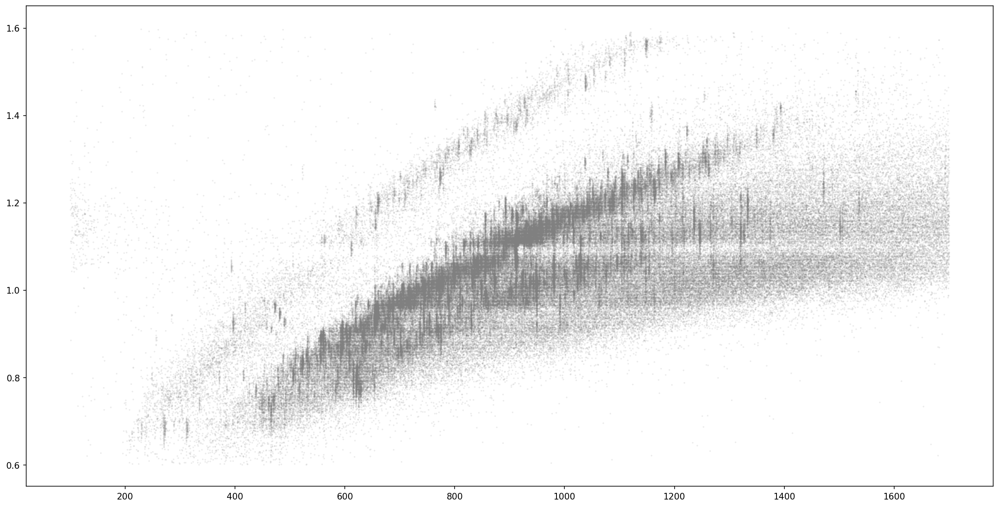

In [13]:
mz = [x["mz"] for x in peaks]
mobility = [x["mobility"] for x in peaks]
charge = [x["charge_label"] for x in peaks]
isotopologues = [x["iso_label"] for x in peaks]
charge = [x["charge_label"] for x in peaks]
pep_label = [x["pep_label"] for x in peaks]

plt.figure(figsize=(20, 10), dpi=150)
plt.scatter(sample_frame.mz, sample_frame.mobility, s=1, alpha=.1, color="gray", label="raw data")
plt.scatter(mz, mobility, alpha=1, s=3, c=charge, cmap=charge_cmap, label="Predicted Feature")
plt.legend()
plt.show()

In [14]:
from collections import defaultdict

def group_features_with_mobility_cutoff(peaks: list[dict], mobility_expansion=0.02, mz_exp_hi=3.0, mz_exp_lo=1.0) -> list[dict]:
    """
    Group peaks into features based on window, charge, peptide label, and mobility proximity.

    Args:
        peaks: list of peak dicts
        mobility_expansion: float, allowed mobility deviation from seed (±)

    Returns:
        List of grouped features
    """
    # Normalize charge and peptide label (shifted to 0-based)
    for p in peaks:
        p['charge_label'] -= 2
        p['pep_label'] -= 2
        p['iso_label'] -= 2

    # Sort globally by intensity descending
    sorted_peaks = sorted(peaks, key=lambda p: p['intensity'], reverse=True)

    # Track assigned peaks
    assigned = set()
    feature_list = []

    for i, seed in enumerate(sorted_peaks):
        peak_id = id(seed)
        if peak_id in assigned:
            continue

        win = seed['window_index']
        chg = seed['charge_label']
        pep = seed['pep_label']
        mob_seed = seed['mobility']
        mz_seed = seed['mz']

        # Define feature bounds
        mz_lo = mz_seed - mz_exp_lo
        mz_hi = mz_seed + mz_exp_hi

        # Define feature bounds
        mob_lo = mob_seed - mobility_expansion
        mob_hi = mob_seed + mobility_expansion

        # Select other unassigned peaks in same group + within mobility bounds
        group_peaks = []
        for p in sorted_peaks:
            if id(p) in assigned:
                continue
            if (
                p['window_index'] == win and
                p['charge_label'] == chg and
                p['pep_label'] == pep and
                mob_lo <= p['mobility'] <= mob_hi and 
                mz_lo <= p['mz'] <= mz_hi
            ):
                group_peaks.append(p)
                assigned.add(id(p))

        group_peaks = sorted(group_peaks, key=lambda x: x['iso_label'])

        feature_list.append({
            'window_index': win,
            'charge_label': chg,
            'pep_label': pep,
            'mobility_seed': mob_seed,
            'peaks': group_peaks
        })

    return feature_list

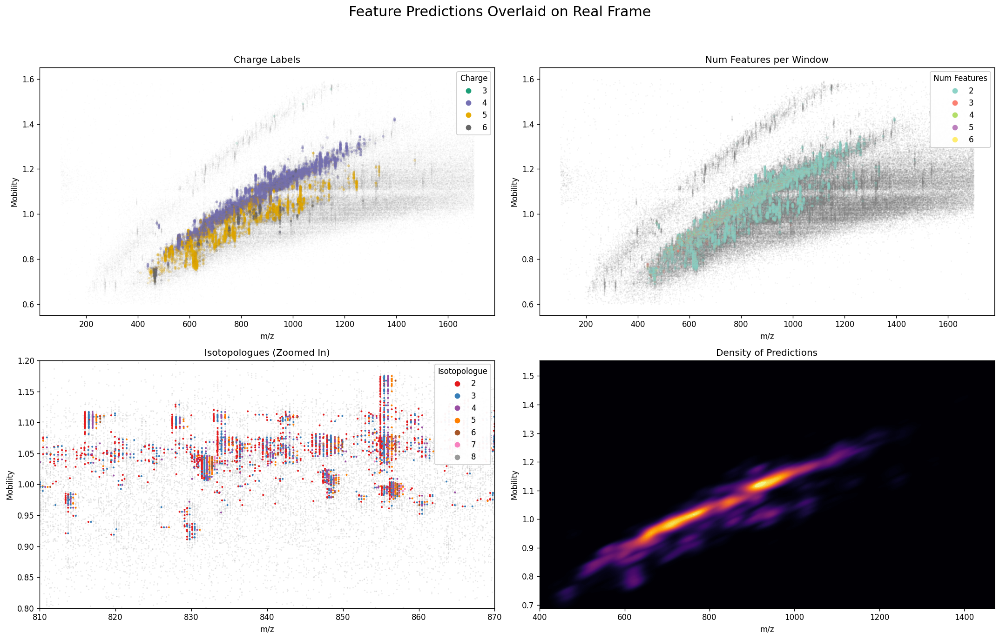

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.lines as mlines

# Background points
bg_mz = np.array(sample_frame.mz)
bg_mobility = np.array(sample_frame.mobility)

# Prediction points
mz = np.array([x["mz"] for x in peaks])
mobility = np.array([x["mobility"] for x in peaks])
charge = np.array([x["charge_label"] for x in peaks])
iso = np.array([x["iso_label"] for x in peaks])
pep = np.array([x["pep_label"] for x in peaks])

# Define slice limits
mz_min, mz_max = 810, 870
mob_min, mob_max = 0.8, 1.2

# Filter predicted peaks
mask = (mz >= mz_min) & (mz <= mz_max) & (mobility >= mob_min) & (mobility <= mob_max)
mz_slice = mz[mask]
mobility_slice = mobility[mask]
charge_slice = charge[mask]
iso_slice = iso[mask]
pep_slice = pep[mask]

# Filter background
bg_mask = (bg_mz >= mz_min) & (bg_mz <= mz_max) & (bg_mobility >= mob_min) & (bg_mobility <= mob_max)
bg_mz_slice = bg_mz[bg_mask]
bg_mobility_slice = bg_mobility[bg_mask]

# Setup
fig, axs = plt.subplots(2, 2, figsize=(18, 12), dpi=120)
fig.suptitle("Feature Predictions Overlaid on Real Frame", fontsize=18)

# Set black background on lower right
axs[1, 1].set_facecolor("black")

def get_discrete_cmap(values, base_cmap='tab20'):
    classes = np.unique(values)
    cmap = plt.get_cmap(base_cmap)
    colors = cmap(np.linspace(0, 1, len(classes)))
    return ListedColormap(colors), classes

def set_limits(ax):
    ax.set_xlim(mz_min, mz_max)
    ax.set_ylim(mob_min, mob_max)

# === Panel 1: Charge Labels ===
charge_cmap, charge_classes = get_discrete_cmap(charge, 'Dark2')
axs[0, 0].scatter(bg_mz, bg_mobility, s=1, alpha=0.01, color="gray")
axs[0, 0].scatter(mz, mobility, c=charge, cmap=charge_cmap, s=6, alpha=0.1)
axs[0, 0].set_title("Charge Labels")
axs[0, 0].set_xlabel("m/z")
axs[0, 0].set_ylabel("Mobility")
legend1 = axs[0, 0].legend(
    handles=[
        mlines.Line2D([], [], marker='o', linestyle='', color=charge_cmap(i), label=str(c))
        for i, c in enumerate(charge_classes)
    ],
    title="Charge",
    loc='upper right'
)
axs[0, 0].add_artist(legend1)

# === Panel 2: Peptide Labels ===
pep_cmap, pep_classes = get_discrete_cmap(pep, 'Set3')
axs[0, 1].scatter(bg_mz, bg_mobility, s=1, alpha=0.05, color="gray")
axs[0, 1].scatter(mz, mobility, c=pep, cmap=pep_cmap, s=6, alpha=0.1)
axs[0, 1].set_title("Num Features per Window")
axs[0, 1].set_xlabel("m/z")
axs[0, 1].set_ylabel("Mobility")
legend2 = axs[0, 1].legend(
    handles=[
        mlines.Line2D([], [], marker='o', linestyle='', color=pep_cmap(i), label=str(c))
        for i, c in enumerate(pep_classes)
    ],
    title="Num Features",
    loc='upper right'
)
axs[0, 1].add_artist(legend2)

# === Panel 3: Isotopologue Labels (Zoomed In) ===
iso_cmap, iso_classes = get_discrete_cmap(iso_slice, 'Set1')
axs[1, 0].scatter(bg_mz_slice, bg_mobility_slice, s=1, alpha=0.1, color="gray")
axs[1, 0].scatter(mz_slice, mobility_slice, c=iso_slice, cmap=iso_cmap, s=2, alpha=1)
axs[1, 0].set_title("Isotopologues (Zoomed In)")
axs[1, 0].set_xlabel("m/z")
axs[1, 0].set_ylabel("Mobility")
legend3 = axs[1, 0].legend(
    handles=[
        mlines.Line2D([], [], marker='o', linestyle='', color=iso_cmap(i), label=str(c))
        for i, c in enumerate(iso_classes)
    ],
    title="Isotopologue",
    loc='upper right'
)
axs[1, 0].add_artist(legend3)
set_limits(axs[1, 0])

# === Panel 4: Smoothed Density (Full Space with Black Background) ===
sns.kdeplot(
    x=mz, 
    y=mobility, 
    fill=True, 
    cmap="inferno", 
    bw_adjust=0.5,
    ax=axs[1, 1],
    levels=100,
    thresh=0
)
axs[1, 1].set_title("Density of Predictions")
axs[1, 1].set_xlabel("m/z")
axs[1, 1].set_ylabel("Mobility")
axs[1, 1].set_xlim(mz.min(), mz.max())
axs[1, 1].set_ylim(mobility.min(), mobility.max())

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("TEST_slice_fixed.png")
plt.show()

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.cm import get_cmap
from matplotlib.lines import Line2D

def plot_single_feature_density(feature, annotate_isotopes=True):
    """
    Visualize a single feature in m/z vs. mobility space with intensity encoding.

    Args:
        feature: dict with keys 'peaks' (list of peak dicts)
        annotate_isotopes: if True, label each point with its iso_label
    """
    peaks = feature["peaks"]
    
    mz = np.array([p["mz"] for p in peaks])
    mobility = np.array([p["mobility"] for p in peaks])
    intensity = np.array([p["intensity"] for p in peaks])
    iso = np.array([p["iso_label"] for p in peaks])

    norm_intensity = intensity / intensity.max()

    plt.figure(figsize=(10, 6), dpi=150)
    sc = plt.scatter(
        mz, mobility,
        s=60 + 240 * norm_intensity,  # scale size
        c=norm_intensity,
        cmap='viridis',
        edgecolors='black'
    )

    plt.xlabel("m/z")
    plt.ylabel("Mobility")
    plt.title(f"Feature: pep={feature['pep_label']}, charge={feature['charge_label']}, {len(peaks)} peaks")
    plt.colorbar(sc, label="Normalized Intensity")

    if annotate_isotopes:
        for m, mob, iso_i in zip(mz, mobility, iso):
            plt.text(m + 0.01, mob, str(iso_i), fontsize=8, va='center')

    plt.tight_layout()
    plt.show()

In [28]:
F = group_features_with_mobility_cutoff(peaks)

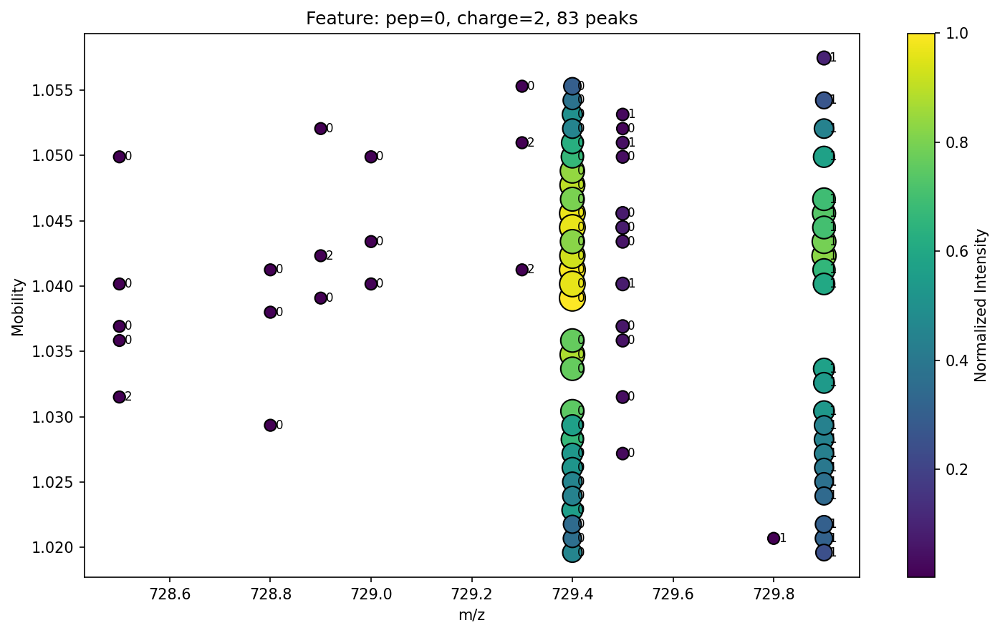

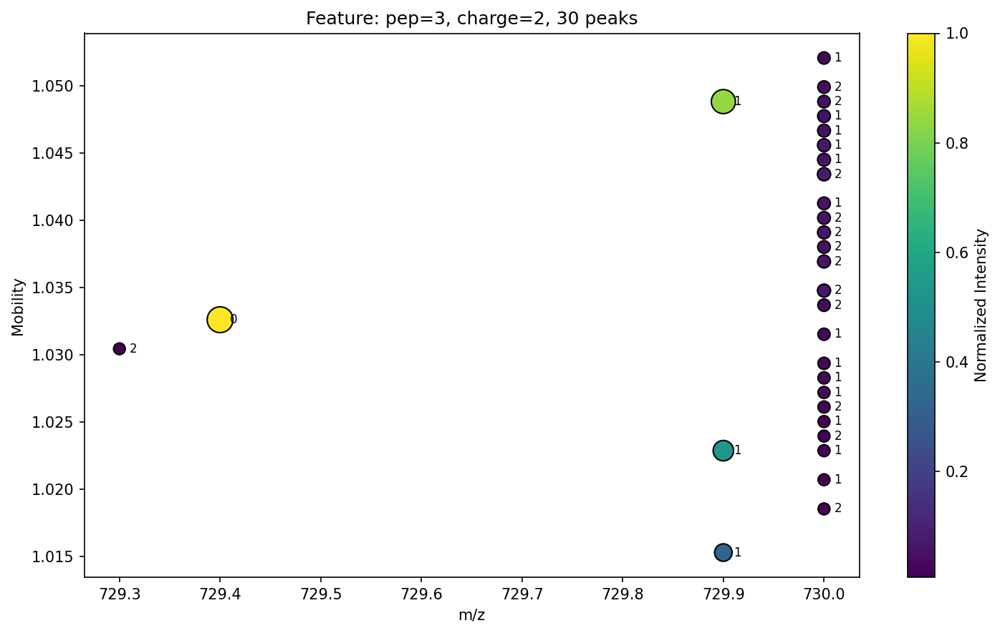

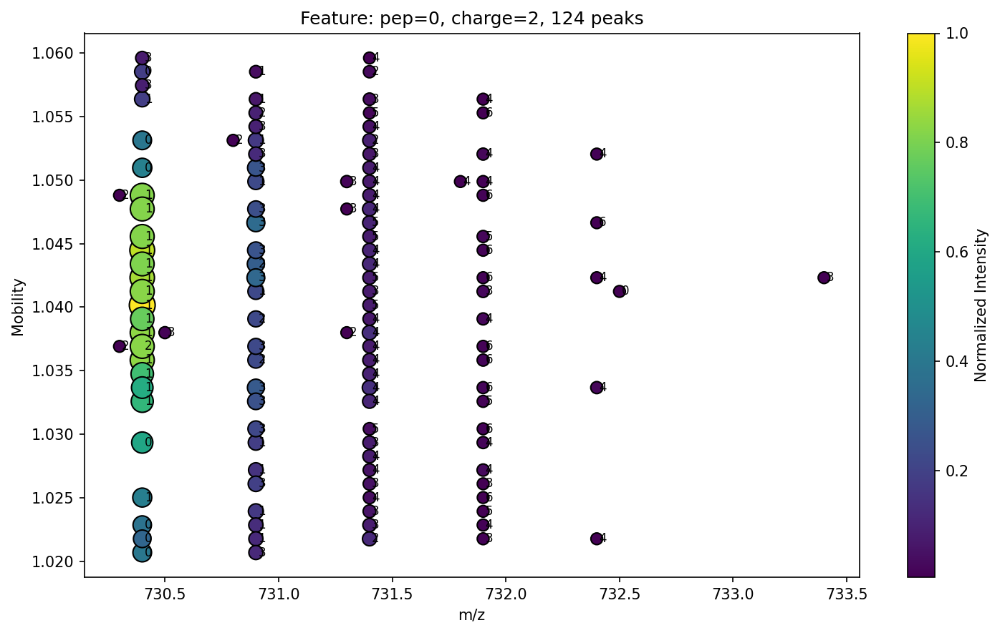

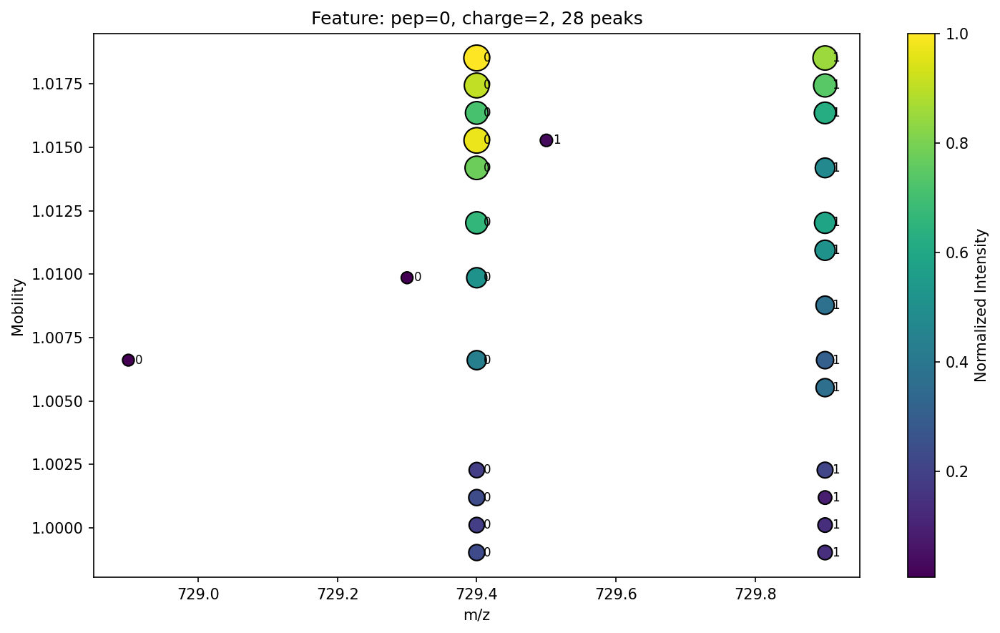

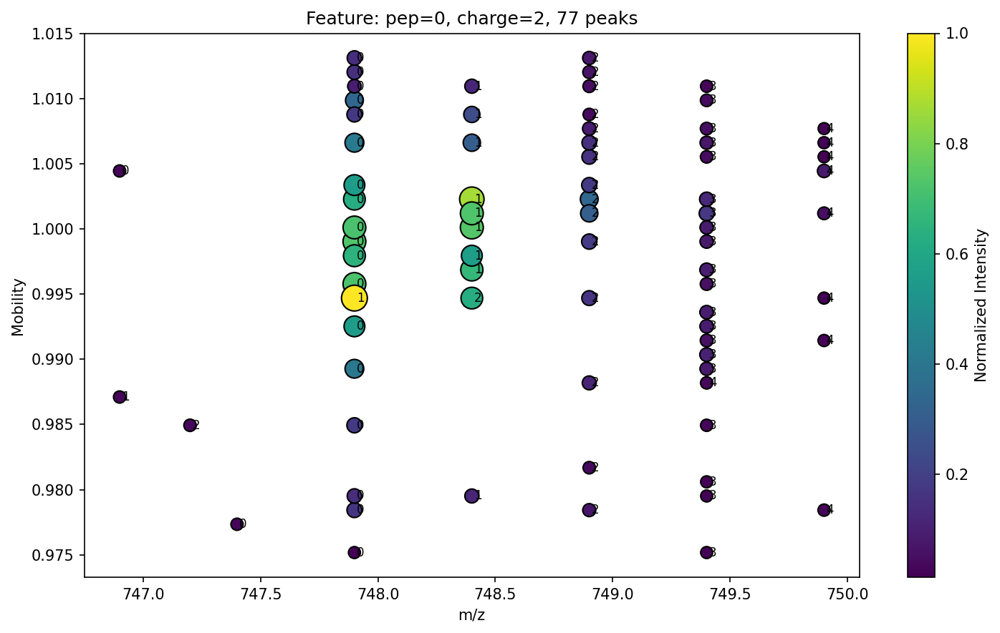

...

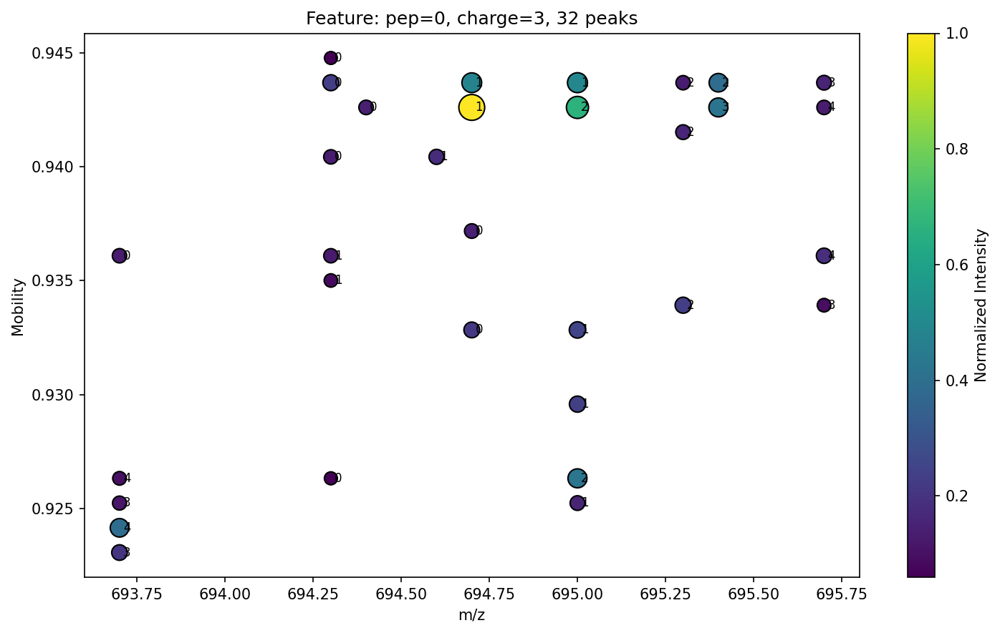

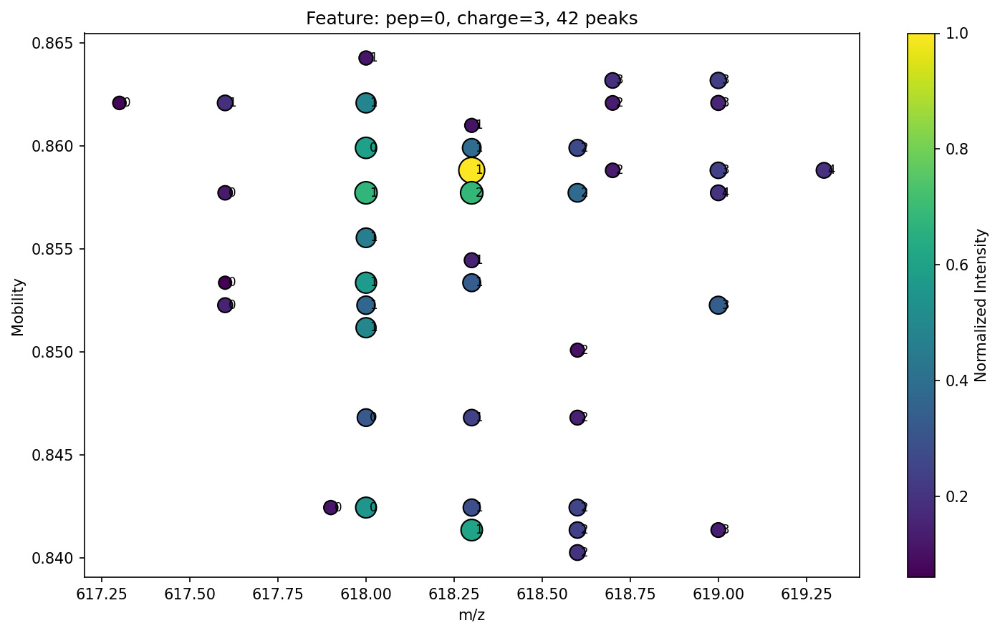

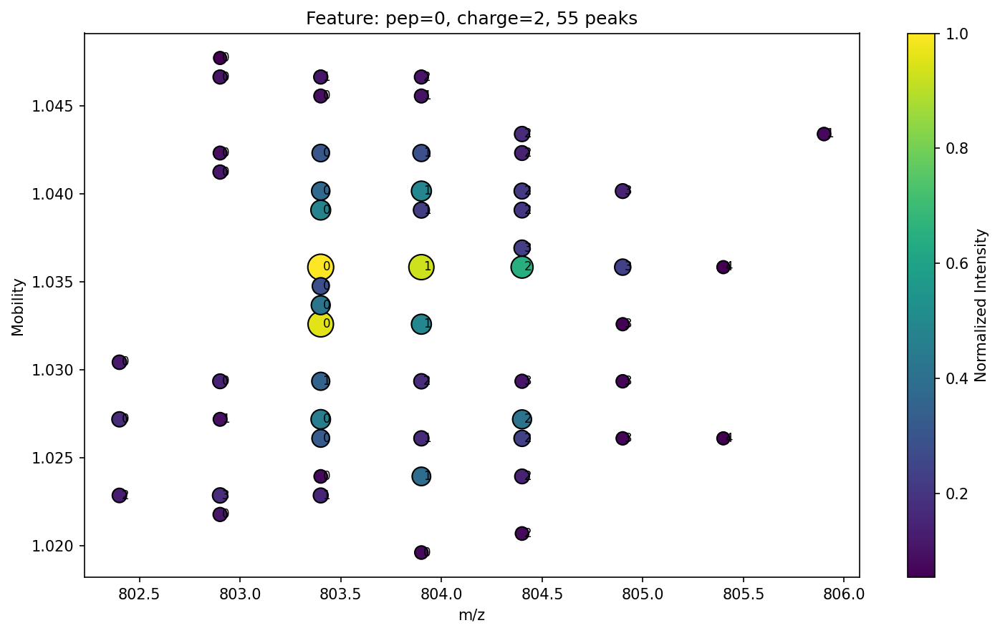

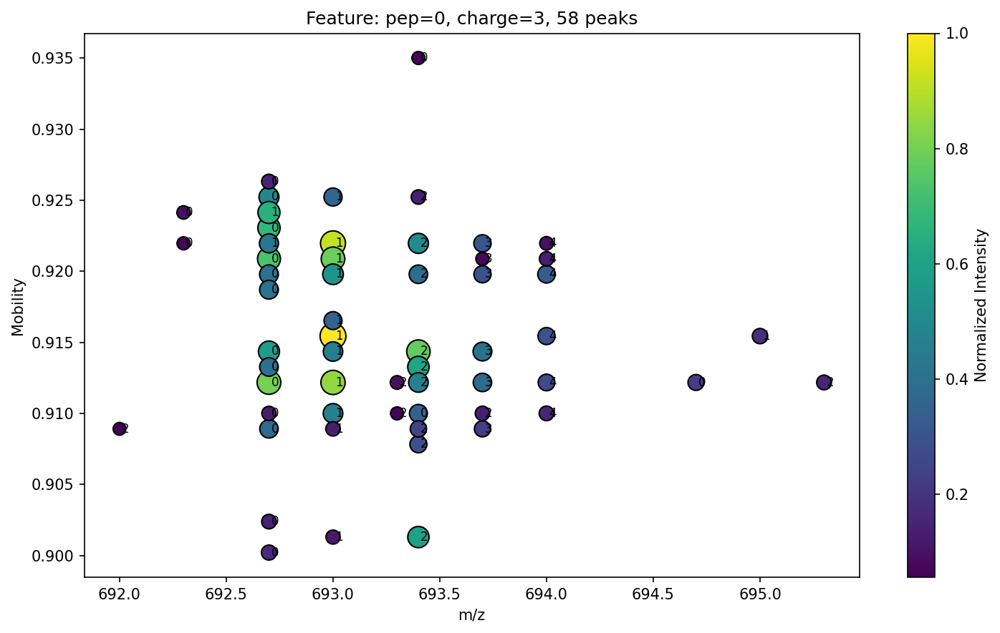

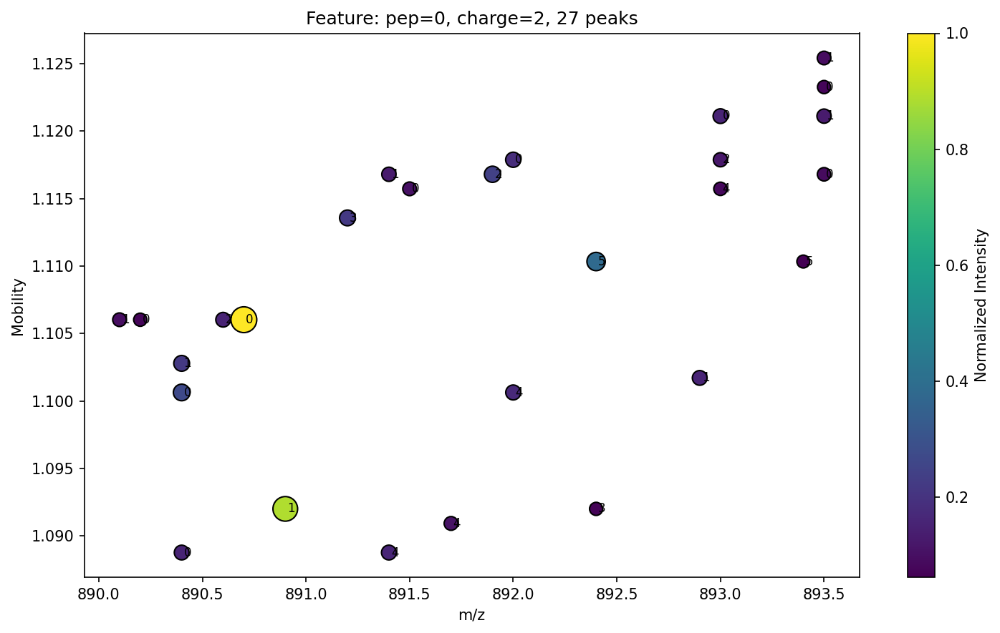

KeyboardInterrupt: 

In [29]:
for f in F:
    if len(f["peaks"]) > 25:
        plot_single_feature_density(f)